In [67]:
import numpy as np
def compute_complexity(ts):
    """compute complexity of a single TS"""
    #right now I don't need to normalized by length, since all subsequences considered from the same dataset should have the
    #same len, but keep in mind in the future
    return np.sqrt(np.sum((ts[i]-ts[i+1])**2 for i in range(len(ts)-1)))



import pylab as plt
%matplotlib inline






# the best way to do this is to have an in-memory model of all subsequences and then write selected to new versions of files
#for running the mk_ng.exe

#read data file
def read_txt_data(data_file):
    f=open(data_file,'r').read().split('\n')
    all_txt_data=[]
    for line in f:
        if line=='':
            continue
        l=line.split(' ')
        l=[float(i) for i in l]
        all_txt_data.append(l)
    return all_txt_data

def read_csv_data_meta(data_file):
    f=open(data_file,'r').read().split('\n')
    all_csv_data=[]
    for line in f:
        if line=='':
            continue
        l=line.split(',')
        #l=[float(i) for i in l]
        all_csv_data.append(l)
    return all_csv_data


#read in the motif file, then select if you want the subsequences in this motif cluster to be removed and discarded.
            
def ind_rm(par,X,indexes,num_run):
    """get a list of indexes to be removed. all motif cluster files to be removed is stored in tbr/"""
    #the indexes argument is the indexes of the motif clusters, such as 'remove the first 5 clutsers', then indexes is [1,2,3,4,5]
    #notice it starts from 1 b/c this is how the motif clusters files are named
    all_indexes_tbr=[]
    for i in indexes:
        si=str(i)
        if num_run>1:
            m='new_mk_data/downsample_syl_2_meta_100_MKrm_sub_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        elif num_run==1:
            m='new_mk_data/downsample_syl_2_meta_100_MK_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        #get indexes of subseqs from one motif cluster
        this_indexes=inspect_motif(m,False)
        this_indexes=[int(j) for j in this_indexes]
        all_indexes_tbr.extend(this_indexes[:])
    return all_indexes_tbr

def remove_elements_by_ind(ori_list,indices):
    return [i for j, i in enumerate(ori_list) if j not in indices]

def write_to_newtxt(outfile,new_txt_data):
    f=open(outfile,'w').close()
    f=open(outfile,'a')
    for motif in new_txt_data:
        motif=[str(i) for i in motif]
        line=' '.join(motif)
        f.write(line+'\n')
        
    f.close()
    
def write_to_newcsv(outcsvfile,new_csv_data):
    f=open(outcsvfile,'w').close()
    f=open(outcsvfile,'a')
    for motif in new_csv_data:
        motif=[str(i) for i in motif]
        line=','.join(motif)
        f.write(line+'\n')
        
    f.close()
    
#run this process of removing the selected subsequences
def update_data(data_file,csv_file,num_run,X,indexes_tbr):
    all_txt_data=read_txt_data(data_file)
    all_csv_data=read_csv_data_meta(csv_file)
    all_ind_tbr=ind_rm(X,indexes_tbr,num_run)
    print 'number of subsequences to be removed:',len(all_ind_tbr)
    new_txt_data=remove_elements_by_ind(all_txt_data,all_ind_tbr)
    new_csv_data=remove_elements_by_ind(all_csv_data,all_ind_tbr)
    if data_file.endswith('rm_sub.txt'):
        outfile=data_file
    else:
        outfile=data_file.split('.')[0]+'rm_sub.txt'
    if csv_file.endswith('rm_sub.csv'):
        outcsvfile=csv_file
    else:
        outcsvfile=csv_file.split('.')[0]+'rm_sub.csv'
    write_to_newtxt(outfile,new_txt_data)
    write_to_newcsv(outcsvfile,new_csv_data)
    
    
    
    
def inspect_motif(motif_file,plott):
    f=open(motif_file,'r').read().split('\n')
    c=0
    if plott:
        plt.figure()
        print len(f)
    all_ind=[]
    
    for line in f:
        c+=1

        if line!='':
            #print c
            line=line.strip()
            ts=line.split(' ')[1:]
            ind=line.split(' ')[0]
            all_ind.append(ind)
            ts=[float(i) for i in ts]
            #print len(ts)
            if plott:
                plt.plot(ts)
                plt.title(motif_file)
    return all_ind

               
def plot_all_motifs(par,X,num_motif,file_prefix):
    for i in range(1,num_motif):
        si=str(i)
        m=file_prefix+'_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        print m
        all_ind=inspect_motif(m,True)
        plot_originals(all_ind,file_prefix)
        
        
import pylab as plt
%matplotlib inline


def inspect_motif(motif_file,plott):
    f=open(motif_file,'r').read().split('\n')
    c=0
    if plott:
        plt.figure()
        print len(f)
    all_ind=[]
    
    for line in f:
        c+=1

        if line!='':
            #print c
            line=line.strip()
            ts=line.split(' ')[1:]
            ind=line.split(' ')[0]
            all_ind.append(ind)
            ts=[float(i) for i in ts]
            #print len(ts)
            if plott:
                plt.plot(ts)
                plt.title(motif_file)
    return all_ind

def plot_originals(all_ind,file_prefix):
    plt.figure()
    file_name=file_prefix+'.csv'
    print 'original file:',file_name
    f=open(file_name,'r').read().split('\n')
    all_texts=''
    all_comp=[]
    all_tones=[]
    for ind in all_ind:
        line=f[int(ind)]
        l=line.split(',')
        data=l[:-4]
        tones,file_name,position=l[-4],l[-2],l[-1]
        all_tones.append(tones)
        text=','.join([tones,file_name,position])
        text+='\n'
        plt.plot(data)
        all_texts+=text
        data=[float(i) for i in data]
        comp_score=compute_complexity(data)
        all_comp.append(comp_score)
    plt.text(.1,-.4,all_texts)
    ave_score=np.mean(all_comp)
    TLC,sim=compute_TLC(all_tones)
    plt.title('mean complexity score:'+str(ave_score)+"|TLC:"+str(TLC))
                       
        
        
def plot_all_motifs_meta(par,X,num_motif,file_prefix,path='new_mk_data/'):
    for i in range(1,num_motif):
        si=str(i)
        #path could be 'new_mk_data' or if just in mk_ng directory, use ""
        m=path+ file_prefix + '_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        print m
        all_ind=inspect_motif(m,True)
        file_prefix_csv=file_prefix.replace('_MK','')
        file_prefix_csv='new_csv_data/'+file_prefix_csv
        plot_originals(all_ind,file_prefix_csv)


In [128]:
def read_motif_file(motif_file):
    f=open(motif_file,'r').read().split('\n')
    motifs=[]
    all_inds=[]
    for line in f:
        if line!='':
            line=line.strip()
            ts=line.split(' ')[1:]
            ts=[float(i) for i in ts]
            ind=line.split(' ')[0]
            ind=int(ind)
            all_inds.append(ind)
            motifs.append(ts)
            ts=[float(i) for i in ts]
         
    return all_inds,motifs


def gen_selected_scores(par,X,selected_motifs,file_prefix):
    """generate the complexity scores(normalized) from the motif files directly"""
    #if you want to select all motifs from 1 to 30, for instance, you just go selected_motifs=range(1,31)
    all_complexity_scores=[]
    for i in selected_motifs:
        si=str(i)
        m="new_mk_data/"+ file_prefix + '_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        all_inds,motifs=read_motif_file(m)
        for motif in motifs:
            complexity=compute_complexity(motif)
            all_complexity_scores.append(complexity)
    return all_complexity_scores

    
    
def plot_spu_real(selected_motifs):
    #spurious scores
    spu_scores=gen_selected_scores('52',2,selected_motifs,"downsample_syl_2_meta_100_MK")
     
    #random scores
    bigram='downsample_syl_2_meta_100_MK.txt'
    
    #ambiguous scores
    
    #plotting all scores
    data_zip=zip(spu_scores,real_scores)
    data_zip=np.array(data_zip)
    colors = ['tan', 'lime']
    plt.hist(data_zip, 30, normed=1, histtype='bar', color=colors, label=['spurious','random'],range=[0.3,2])
    plt.legend(prop={'size': 10})
    plt.title('Distribution of 200 spurious motifs, randomly sampled subsequences from corpus')
    plt.show()
    
def plot_three_classes(score_1,score_2,score_3,class_labels,num_bins=20,range_x=[0,2]):
    data_zip=zip(score_1,score_2,score_3)
    data_zip=np.array(data_zip)
    colors = ['red', 'lime','blue']
    plt.hist(data_zip, num_bins, normed=1, histtype='bar', color=colors, label=class_labels,range=range_x)
    plt.legend(prop={'size': 10})
    #plt.title('Distribution of complexity scores from CMN corpus')
    plt.show()

In [65]:

def equal_bin(a,b):
    if a==b:
        return 1
    else:
        return 0

def pairwise_TLC_score(l_1,l_2):
    assert len(l_1)==len(l_2)
    score=0
    for i in range(len(l_1)):
        score+=equal_bin(l_1[i],l_2[i])
    return score    

def max_score(input_len,N):
    """input_len=how many labels;N=len of each label"""    
    return N*(input_len * (input_len-1))/2

In [174]:
def get_comp_scores(X,indexes_tbr,num_run,par,data_file):    
    """get complexity scores from the original subsequences in new_mk_data/"""
    #X=2
    #indexes_tbr=motif_class_inds
    #num_run=1
    #get indexes of the subsequences found in motif clusters from the original data file 
    all_ind_tbr=ind_rm(par,X,indexes_tbr,num_run)
    #complexity scores of three classes
    all_txt_data=read_txt_data(data_file)
    scores=[]
    for i in all_ind_tbr:
        subs=all_txt_data[int(i)]
        complexity_score=compute_complexity(subs)
        scores.append(complexity_score)
    return scores



def get_tone_labels(all_inds,csv_file):
    all_labels=[]
    all_csv_data=read_csv_data_meta(csv_file)
    for i in all_inds:
        line=all_csv_data[i]
        label=line[-4]
        all_labels.append(label)
    return all_labels

def motif_clust_TLC(motif_cluster_file,csv_file):
    """get TLC score for one motif cluster.
    TLC is not a measure of one subsequence but a measure of a cluster"""
    #for each motif cluster, we need to compute a TLC score by extracting all of its members' 
    #tone labels
    #for each cluster, we extract all indexes of its members, then access those indexes in 
    #original csv file, compile a list of labels, to feed to compute TLC algorithm
    
    #get all indexes from motif cluster file
    all_inds,motifs=read_motif_file(motif_cluster_file)
    #get the tone labels of these index from original csv version file
    tone_labels=get_tone_labels(all_inds,csv_file)
    TLC,sim=compute_TLC(tone_labels)
    
    return TLC

def multi_motifs_TLC(par,class_indx,X,csv_file,file_prefix,path='new_mk_data/'):
    """compute TLC scores for a list of motif clusters, input by index of motif cluster files"""
    #for example, class_indx can be all indexes from a x=2,k=200 motif files
    
    #for each motif cluster file given by the class_indx, get a cluster TLC score
    all_scores=[]
    for i in class_indx:
        si=str(i)
        motif_file=path+file_prefix + '_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        #print motif_file
        score=motif_clust_TLC(motif_file,csv_file)
        all_scores.append(score)
    return all_scores

            
def average_complexity(motif_file):
    """compute average complexity for a motif cluster using normalized score"""
    all_mot=open(motif_file,'r').read().split('\n')
    all_comp=[]
    for line in all_mot:
        if line!='':
            l=line.strip().split(' ')
            #compute complexity score for one subsequence at a time
            data=[float(i) for i in l[1:]]
            complexity=compute_complexity(data)
            all_comp.append(complexity)
    return np.mean(all_comp)            


def TLC_by_complexity(par,X,k,csv_file,file_prefix,path='new_mk_data/'):
    """in order to see the correlation of complexity and TLC we use this function to output all pairs of ave_comp,TLC scores 
    for each motif cluster"""
    #for ex, if there are 102 actual motif clusters from the current data set, we use k=103
    all_score_pairs=[]
    for i in range(1,k+1):
        si=str(i)
        motif_file=path+file_prefix + '_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        TLC_score=motif_clust_TLC(motif_file,csv_file)
        ave_comp=average_complexity(motif_file)
        all_score_pairs.append((ave_comp,TLC_score))
    return all_score_pairs

def multiple_average_complexity(par,X,file_prefix,indexes,path='new_mk_data/'):
    """given a list of indexes of motif cluster files of a particular class 
    (such as motif cluster 1,4,6..), return a list of average 
    complexity scores for all the motif cluster files in this class"""
    all_scores=[]
    for i in indexes:
        si=str(i)
        motif_file=path+file_prefix + '_txt_%s_100_%s.0_%s.txt'%(par,X,si)
        ave_comp=average_complexity(motif_file)
        all_scores.append(ave_comp)
    return all_scores


from collections import defaultdict
def compute_TLC(input_label):
    similarity = defaultdict(lambda:-1)
    total_score=0
    for i in range(len(input_label)):
        for j in range(len(input_label)):
            if similarity[(j,i)]!= -1 or i==j:
                continue
            similarity_ij=pairwise_TLC_score(input_label[i],input_label[j])
            similarity[(i,j)]=similarity_ij
            total_score+=similarity_ij
    return float(total_score)/max_score(len(input_label),len(input_label[0])),similarity

In [72]:
####### TESTING THE TLC IMPLEMENTATION

#input_label=['3453','3453','3453','3453']
input_label=['42','44','41','41','42','02','43','42','43','44','42']
input_label=['42','44','41','41','42']
input_label=['42','42','42','44','42','42']

#print len(input_label),len(input_label[0])
score,sim=compute_TLC(input_label)
print score
#sanity check
s=[]
for k,v in sim.iteritems():
    #print k
    if v!=-1:
        s.append(v)
assert float(sum(s))/max_score(len(input_label),len(input_label[0]))==score

0.833333333333


# after I incorporated this measure, plot with TLC score

downsample_syl_2_meta_100_MK_txt_0_100_2.0_1.txt
7
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_2.txt
8
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_3.txt
4
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_4.txt
6
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_5.txt
3
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_6.txt
3
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_7.txt
4
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_8.txt
8
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_meta_100_MK_txt_0_100_2.0_9.txt
5
original file: new_csv_data/downsample_syl_2_meta_100.csv
downsample_syl_2_me

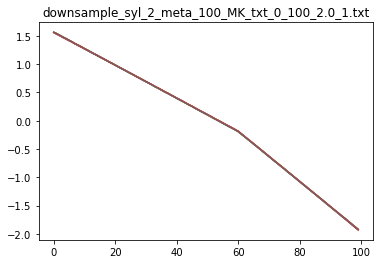

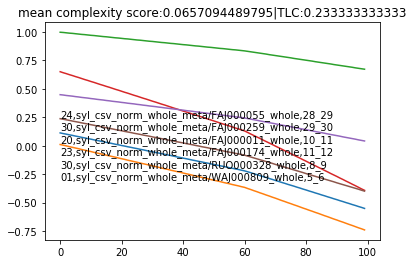

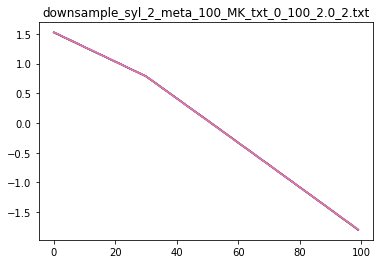

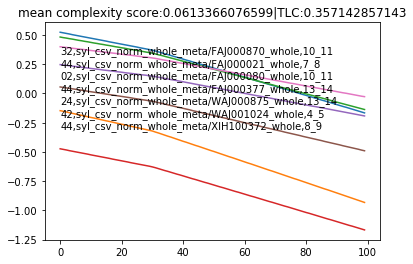

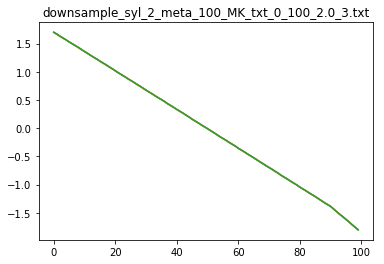

...

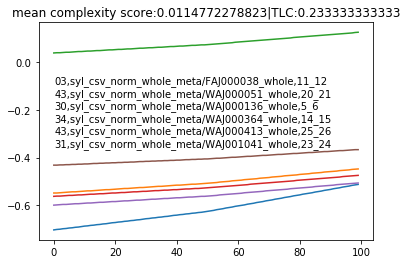

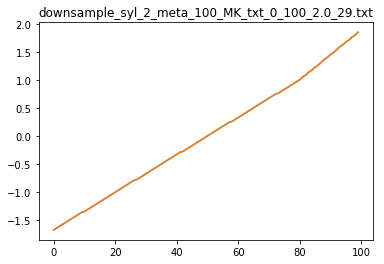

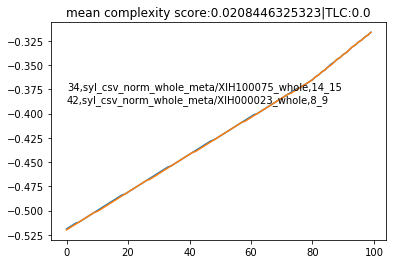

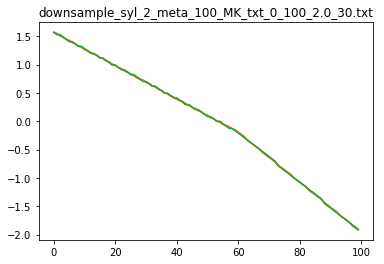

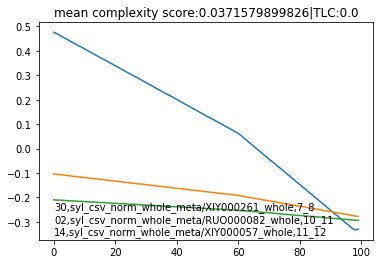

In [64]:
#see the 30 motifs as an example
plot_all_motifs_meta('0',2,31,'downsample_syl_2_meta_100_MK',"")

In [ ]:
#next: we can analyze if the distribution of TLC scores of linear motifs is different from q-linear and n-linear motifs.
#if we assume the three class evaluation, we still need the distribution of complexity scores of the three classes.
#we also need to test the pruning (iterative) behavior of this new data set.

new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_1.txt
7
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_2.txt
8
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_3.txt
4
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_4.txt
6
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_5.txt
3
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_6.txt
3
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_7.txt
4
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_syl_2_meta_100_MK_txt_52_100_2.0_8.txt
8
original file: new_csv_data/downsample_syl_2_meta_100.csv
new_mk_data/downsample_s

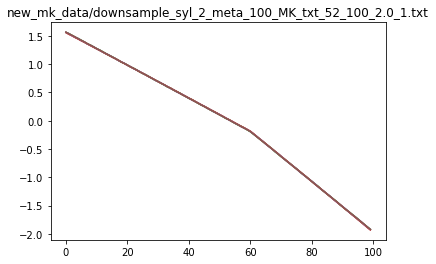

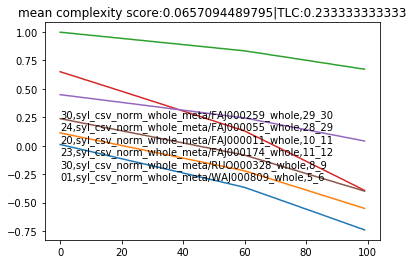

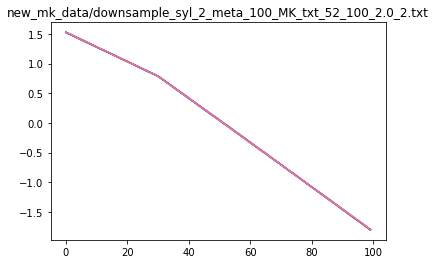

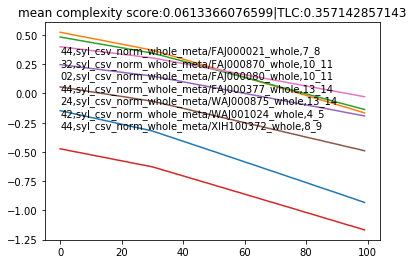

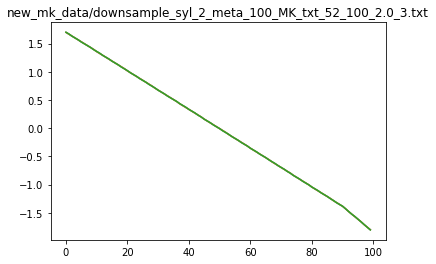

...

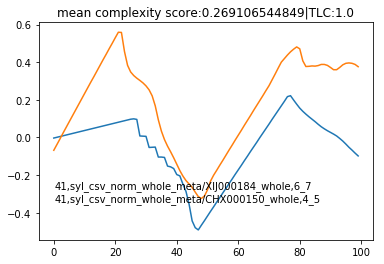

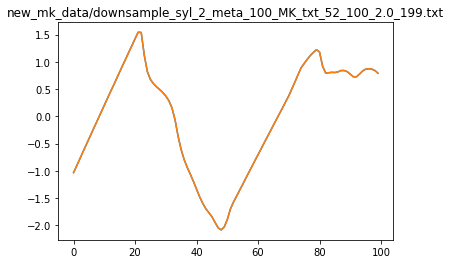

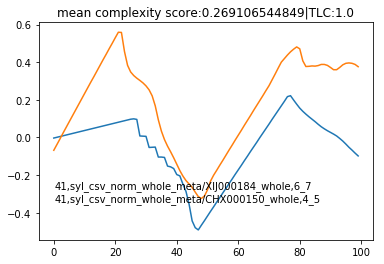

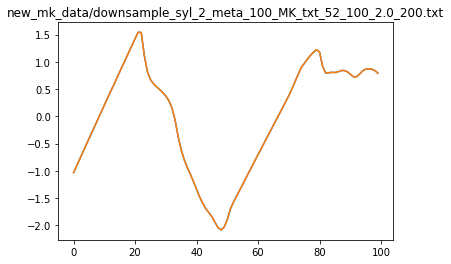

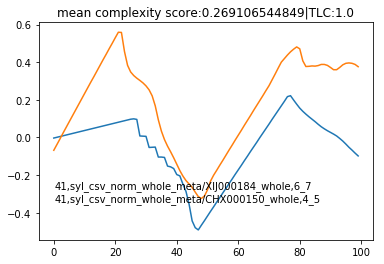

In [70]:
plot_all_motifs_meta('52',2,201,'downsample_syl_2_meta_100_MK')

In [74]:
#X=2,k=200,one iteration (no pruning)
#THIS IS HAND ANNOTATION OF THE FOUR CLASSES FROM THIS DATA SET OF MOTIFS (200 MOTIF CLUSTER
#FILES, ONLY ABOUT 110 TRUE MOTIF CLUSTERS )
linear=[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,19,20,22,23,24,25,26,27,28,29,30,31,32,33,34,35,37,38,39,40,41,42,43,44,55,56]
qlinear=[18,45,46,47,48,49,50,51,52,58,59,60,67,68,72,73,76,85,89]
nonlinear=[21,36,53,54,57,61,62,63,64,65,66,69,70,71,74,75,77,78,79,80,81,82,83,84,86,87,88,90,91,92,93,94,95,96,97,98,99,100,101,102]
bad=[103,104,105,106,107]

In [218]:
#pickle these ground truth
import pickle
pickle_file='bigram100p_gtruth.p'
ground_truth_dict={'linear':linear,'qlinear':qlinear,'nonlinear':nonlinear,'bad':bad}
pickle.dump(ground_truth_dict, open( pickle_file, "wb" ) )

# plot complexity scores of the three classes to see threshold, and inspect TLC

## plotting three classes of complexity scores

In [79]:
#these are the original motif complexity scores
data_file='downsample_syl_2_meta_100_MK.txt'
par='52'
linear_scores=get_comp_scores(2,linear,1,par)
qlinear_scores=get_comp_scores(2,qlinear,1,par)
nonlinear_scores=get_comp_scores(2,nonlinear,1,par)


In [81]:
print len(linear_scores),len(qlinear_scores),len(nonlinear_scores)

190 122 274


In [90]:
# we also want the complexity scores of the normalized motifs in cluster
linear_scores_norm=gen_selected_scores('52',2,linear,"downsample_syl_2_meta_100_MK")
qlinear_scores_norm=gen_selected_scores('52',2,qlinear,"downsample_syl_2_meta_100_MK")
nonlinear_scores_norm=gen_selected_scores('52',2,nonlinear,"downsample_syl_2_meta_100_MK")
print len(linear_scores_norm),len(qlinear_scores_norm),len(nonlinear_scores_norm)

190 122 274


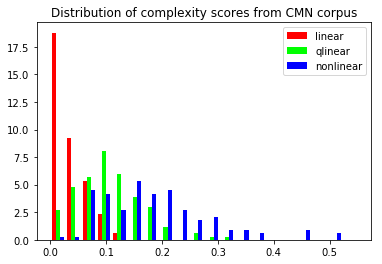

In [109]:
#un-normalized subsequences complexity scores
plot_three_classes(linear_scores,qlinear_scores,nonlinear_scores,['linear','qlinear','nonlinear'],20,[0,0.55])

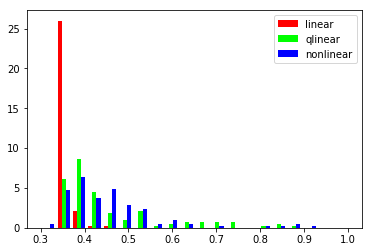

In [216]:
#normalized motif subsequences complexity scores
plot_three_classes(linear_scores_norm,qlinear_scores_norm,nonlinear_scores_norm,['linear','qlinear','nonlinear'],20,[0.3,1])

## look at the distribution of TLC scores between the three classes

In [ ]:
file_prefix='downsample_syl_2_meta_100_MK'
csv_file='new_csv_data/downsample_syl_2_meta_100.csv'
linear_TLC=multi_motifs_TLC('52',linear,2,csv_file,file_prefix)
qlinear_TLC=multi_motifs_TLC('52',qlinear,2,csv_file,file_prefix)
nonlinear_TLC=multi_motifs_TLC('52',nonlinear,2,csv_file,file_prefix)

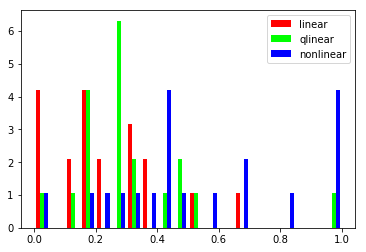

In [129]:
#motifs TLC - TLC is just about a motif clusters tone labels, so normalization doesn't matter 
#class size in number of motif clusters: 43,19,40, 102 motif in total
plot_three_classes(linear_TLC,qlinear_TLC,nonlinear_TLC,['linear','qlinear','nonlinear'],20,[0,1])

from this we do see some correlation with classes - the linear class has most number of lower TLC scores (less consistent tone labels) and the non_linear class has most high TLC scores. q-linear is behaving mostly similarly with the linear. 

# corelation between TLC and complexity 

if we plot TLC against complexity score?
although TLC is a per cluster measure so you'd have to use TLC against average-cluster complexity score.

concretely we probably need to iterate through motif clusters. for each cluster, compute a TLC score and a complexity score.

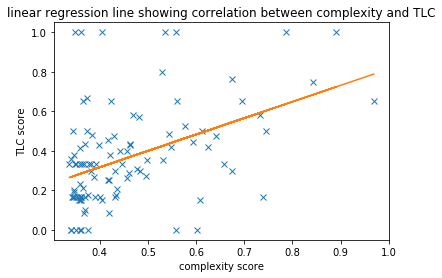

In [171]:
file_prefix='downsample_syl_2_meta_100_MK'
csv_file='new_csv_data/downsample_syl_2_meta_100.csv'
all_score_pairs=TLC_by_complexity('52',2,102,csv_file,file_prefix)
x=[k[0] for k in all_score_pairs]
y=[k[1] for k in all_score_pairs]
x=np.array(x)
y=np.array(y)
plt.plot(x,y,'x')
m, b = np.polyfit(x, y, 1)

plt.plot(x, m*x + b, '-')
plt.xlabel('complexity score')
plt.ylabel('TLC score')
plt.title('linear regression line showing correlation between complexity and TLC')

In [217]:
np.corrcoef(x,y)

array([[ 1.        ,  0.44252487],
       [ 0.44252487,  1.        ]])

the above shows that complexity and TLC has weak to moderate positive correlation.

Nonetheless, in the two-class classification scenario (amb vs good), it is a useful feature, the TLC.

# evaluation and algorithm

we want to try to classify the motif cluster (not indie subsequences) as one of three classes: 

1. spurious
2. amb
3. good

Objectively how we evaluate these classes are based on linearity. See OneNote for discussion. 
we want to try using complexity and the TLC as features for each class. Let's try this for the current data set first. 

The above plot of complexity distribution is by subsequences. Do we need to make a by-motif plot? what difference does that make?

# current plan

1. we'll do an averaged complexity score (per motif cluster) plot, as we'll likely use this feature in classification into three classes to make a decision for each motif cluster, not indie subsequence.

2. if it holds that the threshold for complexity works well for pruning the spurious motifs, we'll use that as a first step (and do the spurious motif pruning evaluation with different strategies), then we are left with the amb and good classes, and we can do some classification with TLC as well. 

# average complexity score of motif clusters and its distribution among three classes

In [177]:
#we are working with normalized (motif cluster) complexity scores always now
par='52'
X=2
linear_ave_comp=multiple_average_complexity(par,X,file_prefix,linear)
qlinear_ave_comp=multiple_average_complexity(par,X,file_prefix,qlinear)
nonlinear_ave_comp=multiple_average_complexity(par,X,file_prefix,nonlinear)


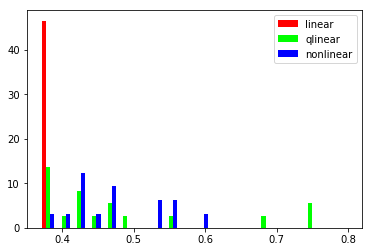

In [186]:
plot_three_classes(linear_ave_comp,qlinear_ave_comp,nonlinear_ave_comp,['linear','qlinear','nonlinear'],20,[0.37,0.8])


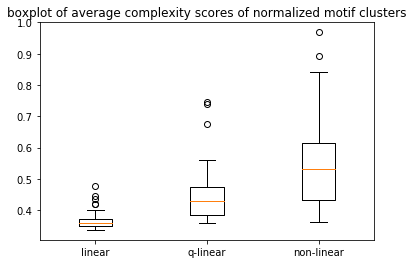

In [200]:
plt.boxplot([linear_ave_comp,qlinear_ave_comp,nonlinear_ave_comp])
plt.xticks([1, 2, 3], ['linear', 'q-linear', 'non-linear'])
plt.title('boxplot of average complexity scores of normalized motif clusters')

##  Produce some data sets to look at classification

In [205]:
#create a data set for classification of spurious vs others classes using complexity score
#by decision tree it helps us select a boundary optimalis
for i in linear_ave_comp:
    print str(i)+",SP"
for i in qlinear_ave_comp:
    print str(i) + ",NS"
for i in nonlinear_ave_comp:
    print str(i) + ",NS"

0.359136938482,SP
0.339711104399,SP
0.35465431494,SP
0.365001252166,SP
0.339018144122,SP
0.343772027614,SP
0.336446533699,SP
0.345967918011,SP
0.346212705767,SP
0.34229116662,SP
0.357727542886,SP
0.348824834647,SP
0.345086680783,SP
0.366642042023,SP
0.357804182526,SP
0.340873308811,SP
0.370116699852,SP
0.350742465215,SP
0.34643297427,SP
0.349391640285,SP
0.373910721888,SP
0.372475794146,SP
0.360483860147,SP
0.361453734901,SP
0.350889941611,SP
0.359366569574,SP
0.351328199444,SP
0.375474877034,SP
0.381083016289,SP
0.360452430182,SP
0.392218051564,SP
0.366464373358,SP
0.36904039519,SP
0.360645762673,SP
0.358864082381,SP
0.346738325266,SP
0.419400214852,SP
0.477515320085,SP
0.418579195333,SP
0.400425847925,SP
0.358685394609,SP
0.445582093338,SP
0.435661037658,SP
0.404161468716,NS
0.389755822555,NS
0.357621483335,NS
0.362546348634,NS
0.388269597222,NS
0.374427657779,NS
0.416482804536,NS
0.430546407063,NS
0.382881442781,NS
0.484298721649,NS
0.461234122859,NS
0.431989036334,NS
0.675014249722

In [210]:
print "complexity,TLC,class"
for i in range(len(linear_ave_comp)):
    print str(linear_ave_comp[i])+ "," + str(linear_TLC[i]) +",SP"
for i in range(len(qlinear_ave_comp)):
    print str(qlinear_ave_comp[i])+ "," + str(qlinear_TLC[i]) +",AMB"
for i in range(len(nonlinear_ave_comp)):
    print str(nonlinear_ave_comp[i])+ "," + str(nonlinear_TLC[i]) +",NS"

complexity,TLC,class
0.359136938482,0.233333333333,SP
0.339711104399,0.357142857143,SP
0.35465431494,0.166666666667,SP
0.365001252166,0.65,SP
0.339018144122,0.0,SP
0.343772027614,0.5,SP
0.336446533699,0.333333333333,SP
0.345967918011,0.190476190476,SP
0.346212705767,0.380952380952,SP
0.34229116662,0.166666666667,SP
0.357727542886,0.15,SP
0.348824834647,0.333333333333,SP
0.345086680783,0.166666666667,SP
0.366642042023,0.333333333333,SP
0.357804182526,0.0,SP
0.340873308811,0.0,SP
0.370116699852,0.1,SP
0.350742465215,0.0,SP
0.34643297427,0.2,SP
0.349391640285,1.0,SP
0.373910721888,0.666666666667,SP
0.372475794146,0.5,SP
0.360483860147,0.15,SP
0.361453734901,0.0,SP
0.350889941611,0.166666666667,SP
0.359366569574,0.166666666667,SP
0.351328199444,0.333333333333,SP
0.375474877034,0.0,SP
0.381083016289,0.3,SP
0.360452430182,0.166666666667,SP
0.392218051564,0.333333333333,SP
0.366464373358,0.0833333333333,SP
0.36904039519,0.166666666667,SP
0.360645762673,0.166666666667,SP
0.358864082381,0.41666

In [212]:
print "complexity,class"
#for i in range(len(linear_ave_comp)):
 #   print str(linear_ave_comp[i])+ ",SP"
for i in range(len(qlinear_ave_comp)):
    print str(qlinear_ave_comp[i]) +",AMB"
for i in range(len(nonlinear_ave_comp)):

    print str(nonlinear_ave_comp[i])+",NS"

complexity,class
0.404161468716,AMB
0.389755822555,AMB
0.357621483335,AMB
0.362546348634,AMB
0.388269597222,AMB
0.374427657779,AMB
0.416482804536,AMB
0.430546407063,AMB
0.382881442781,AMB
0.484298721649,AMB
0.461234122859,AMB
0.431989036334,AMB
0.675014249722,AMB
0.45652158712,AMB
0.744807107956,AMB
0.37829414996,AMB
0.441868027773,AMB
0.558866164518,AMB
0.739958909081,AMB
0.534814718448,NS
0.361335932512,NS
0.891371823141,NS
0.365571105584,NS
0.455672730838,NS
0.463248516047,NS
0.429219268822,NS
0.368401106399,NS
0.463114296098,NS
0.38238567217,NS
0.420862657317,NS
0.417568439195,NS
0.405055572416,NS
0.559198434147,NS
0.422517697172,NS
0.468092282918,NS
0.602320589922,NS
0.559681297232,NS
0.528872268496,NS
0.494951499872,NS
0.607341560794,NS
0.658228567219,NS
0.675360111975,NS
0.498230280625,NS
0.397692803064,NS
0.576674258827,NS
0.433301889173,NS
0.530325429537,NS
0.548838454606,NS
0.625565333035,NS
0.481709866649,NS
0.786371209253,NS
0.592899669023,NS
0.731712173355,NS
0.61177930589